# Computer Science Lab - Ex 1

## Question 1 - Looking at the features

### (a) Opening the Dataset

<p> First things first, let's open the CSV file given to us and have a look on it's content </p>

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('ex1.csv')
df.head()

,Unnamed: 0,incident_id,date,state,city_or_county,address,n_killed,n_injured,congressional_district,gun_stolen,...,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,state_house_district,state_senate_district
0,0,137007,2016-07-23,Utah,Draper,12300 South,0,1,4.0,NaN,...,Man wanted for prior agg asault shot self in h...,0::30,0::Adult 18+,0::Male,0::Eddie Heuser,NaN,0::Injured,0::Subject-Suspect,51.0,11.0
1,1,49807,2014-12-13,-1,Chicago,10400 block of South State Street,-1,0,2.0,0::Unknown,...,"Man shot, drive-by;",0::26,0::Adult 18+,0::Male,0::Tyrece L. Stornes,NaN,0::Killed,0::Victim,28.0,14.0
2,2,2318,2014-01-15,south carolina,Irmo,1 Forest Walk Court,4,0,2.0,NaN,...,NaN,0::28||1::3||2::1||3::38,0::Adult 18+||1::Child 0-11||2::Child 0-11||3:...,0::Female||1::Male||2::Female||3::Male,0::Kia Miller||1::Kyler Devane Miller||2::Syra...,3::Family,0::Killed||1::Killed||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,73.0,19.0
3,3,237635,2018-03-18,-1,Detroit,5600 BLOCK OF JOHN C LODGE FWY,0,0,NaN,0::Unknown,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,238068,2018-03-21,Michigan,Benton Harbor,1200 block of Parkway Dr,0,0,6.0,0::Stolen,...,"raid, drug, stolen handgun",0::34||1::39||2::31||3::47,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male,0::Sylvester Davis III||1::Leonard Robinson||2...,NaN,"0::Unharmed, Arrested||1::Unharmed, Arrested||...",0::Subject-Suspect||1::Subject-Suspect||2::Sub...,79.0,21.0


<p> On first glance it seems like a crime report file in the US. </p>

### Feature set - Categorical,Ordinal,Continious

<p> Let's have a closer look on the feature set </p>

In [3]:
for column in df.columns:
    print(column)

Unnamed: 0
incident_id
date
state
city_or_county
address
n_killed
n_injured
congressional_district
gun_stolen
gun_type
incident_characteristics
latitude
location_description
longitude
n_guns_involved
notes
participant_age
participant_age_group
participant_gender
participant_name
participant_relationship
participant_status
participant_type
state_house_district
state_senate_district


We can see a lot of info about each crime, the **categorical** ones seem to be
- **_state_** - the name of the state.
- **_city_or_county_** - the name of the city which the crime occured.
- **_congressional_district_** - the number of the congresional district in the US.
- **_participant_gender_**
- **_participant_relationship_** - relationship between the participants.
- **_participant_status_** - the status of each participant after the crime.
- **_participant_type_** - participant type in the crime.
- **_gun_stolen_** - whether the gun has been stolen or not.
- **_gun_type_** - to some extent, the gun type can also be considered as categorical.
- **_state_house_district,state_senate_district_** which fall under the congressional district.

In addition to those, there seems to be two _ordinal_ features **participant_age_group** and **date**, since the age group can be ranked from smallest participants to biggest, and the same with date.

Let's find out which features are **continious**

In [4]:
df.dtypes

Unnamed: 0                    int64
incident_id                   int64
date                         object
state                        object
city_or_county               object
address                      object
n_killed                      int64
n_injured                     int64
congressional_district      float64
gun_stolen                   object
gun_type                     object
incident_characteristics     object
latitude                     object
location_description         object
longitude                   float64
n_guns_involved             float64
notes                        object
participant_age              object
participant_age_group        object
participant_gender           object
participant_name             object
participant_relationship     object
participant_status           object
participant_type             object
state_house_district        float64
state_senate_district       float64
dtype: object

From this table above, we can get a suspecion of which features are continious and which are not, although not an accurate answer.
We can see that the table specifies the features **state_house_district** and **state_senate_district** as floats, which are continious data types although these numbers are always whole numbers, and we know that they are more considered as catgorical data.



From the table above and looking at the data we can see that the following are **continious features**
- **_incident_id_**
- **_n-killed_**
- **_n-injured_**
- **_latitude_**
- **_longitude_**
- **_n-guns-involved_**
- **_participant_age_**

### (b) Info about the ctagerical data

In this section i'll be choosing the **_state_** and the **_participant_gender_** features.

Let's check the amount of unique data for each feature, but first since the **participant_gender** feature contains not only the data of the criminal, but also of the victims as well combined in the same row, we'll clean it up by counting the number of participants from each gender.

In [5]:
male_counts,female_counts = 0, 0
for value in df['participant_gender']:
    male_counts += str(value).count("Male")
    female_counts += str(value).count("Female")


And now, we cant check the amount of distinct values for each feature

In [6]:
print('state', df['state'].unique().size)
print('participant_gender', '2') # we took in considiration only 2 genders :)

state 103
participant_gender 2


### 1. state

And plot a histogram to see the distribution

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

(array([12012.,  4614.,  2659.,  2294.,   586.,   699.,   433.,   389.,
          232.,    49.]),
 array([  0. ,  10.2,  20.4,  30.6,  40.8,  51. ,  61.2,  71.4,  81.6,
         91.8, 102. ]),
 <BarContainer object of 10 artists>)

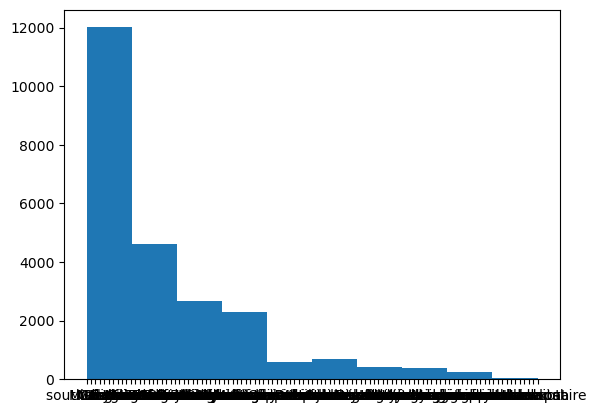

In [8]:
plt.hist(df['state'])

Although we cannot see the names of each state, we can clearly see that it's distribution is not uniform.

### 2. participant_age

We printed the distinct values, and now we'll show the histogram

In [9]:
dd = ['Male'] * male_counts
dd.extend(['Female'] * female_counts)
gender_df = pd.DataFrame({'Gender': dd}) #aranging the data so we can display it in a countplot

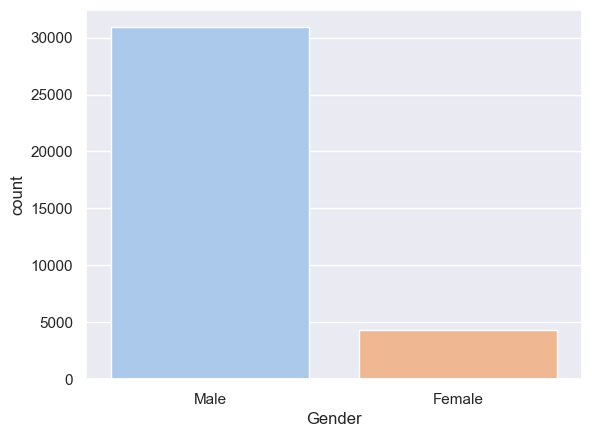

In [10]:
sns.set_theme(context='notebook', style='darkgrid', palette='pastel', font='sans-serif', font_scale=1)
ax = sns.countplot(x='Gender', data=gender_df)

As we can see, the distribution is not uniform, and we can see how much males are enganged in crimes than females (should we converge to feminisim?)

## Question 2

Let's see how many null values each column contains 

In [11]:
df.isnull().sum()

Unnamed: 0                      0
incident_id                     0
date                            0
state                           0
city_or_county                  0
address                      1640
n_killed                        0
n_injured                       0
congressional_district       1187
gun_stolen                   9952
gun_type                     9950
incident_characteristics       29
latitude                      629
location_description        19817
longitude                     775
n_guns_involved              9950
notes                        7967
participant_age              9203
participant_age_group        4185
participant_gender           3599
participant_name            12332
participant_relationship    22365
participant_status           2784
participant_type             2523
state_house_district         3953
state_senate_district        3285
dtype: int64

as we can see, there are quite a good amount of null values for a large number of columns, although these can be problomatic to imputate, for the sake of the excerise we'll impute them.

To do that, we'll use the column.mode() method, which returns the most freuqntly used values in the column, ranked by popularity, and we'll choose the first element.

In [12]:
for column in df.columns:
    df[column].fillna(value=df[column].mode().iat[0], inplace=True) # fill first value in mode series

In [13]:
df.isnull().sum()

Unnamed: 0                  0
incident_id                 0
date                        0
state                       0
city_or_county              0
address                     0
n_killed                    0
n_injured                   0
congressional_district      0
gun_stolen                  0
gun_type                    0
incident_characteristics    0
latitude                    0
location_description        0
longitude                   0
n_guns_involved             0
notes                       0
participant_age             0
participant_age_group       0
participant_gender          0
participant_name            0
participant_relationship    0
participant_status          0
participant_type            0
state_house_district        0
state_senate_district       0
dtype: int64

And viola, we can see that no null values are left in any column.

### (b) Handling inaccuracies and errors

Upon examining the data, we can see a few inaccuracies, most are present in the columns (or features)
_**n_killed**_ , _**n_injured**_ and _**state**_, let's look at the value counts so we can get a better look

In [14]:
def col_info(columns): # given an array/series of data, print their value counts
    for column in columns:
        print(df[column].value_counts())

In [15]:
columns = ["n_killed", "n_injured", "state"]
col_info(columns)

 0    18588
 1     3589
-1     1246
 2      337
-2      129
 3       40
-3       20
 4        9
 5        4
-4        3
-5        2
Name: n_killed, dtype: int64
 0     14236
-1      4489
 1      3725
-2       617
 2       528
-3       154
 3       110
-4        41
 4        31
-5        14
 5        10
-6         2
 6         2
-19        1
 7         1
 9         1
-7         1
 14        1
-10        1
-8         1
-15        1
Name: n_injured, dtype: int64
-1              7999
Illinois        1089
California       995
Florida          893
Texas            850
                ... 
south dakota       2
hawaii             2
maine              1
north dakota       1
vermont            1
Name: state, Length: 103, dtype: int64


We can see that for the **n_killed** and **n_injured** columns contain negative values, which are probably typos in the data itself.



As for the **state** column, we can see that most of them contain the "-1" value, which is probably a value for null.

We'll fix the problem in the first two by substituting the values for their absolute value, using the abs function

In [16]:
columns = ["n_killed", "n_injured"]
for column in columns:
    df[column] = df[column].apply(lambda x : abs(x))

and now if we check their values

In [17]:
col_info(columns)

0    18588
1     4835
2      466
3       60
4       12
5        6
Name: n_killed, dtype: int64
0     14236
1      8214
2      1145
3       264
4        72
5        24
6         4
7         2
19        1
9         1
14        1
10        1
8         1
15        1
Name: n_injured, dtype: int64


We can see that the negative values have been corrected.

As for the _**state**_ column, i noticed that the number of missing values for the column ***city_or_county*** were much less, maybe we can assume the state from the similarity in city or county.

The current value count for the value **-1** is 

In [18]:
df['state'].value_counts()["-1"]

7999

Let's try to assume the state by county/city, we'll define the following function, which changes the value of the county which state is -1 to correspond with the value of the same county which state isnt -1, if it exists.

In [19]:
def assume_state_from_county():
    df.state.replace('-1',np.nan,inplace=True)
    df.state = df.sort_values(by='city_or_county').groupby('city_or_county')['state'].apply(lambda x : x.ffill().bfill())

And if we try running it, and checking the value counts again 

In [20]:
assume_state_from_county()
columns = ["state"]
col_info(columns)

Illinois        1660
California      1393
Florida         1299
Texas           1219
Ohio             938
                ... 
idaho              3
hawaii             2
maine              1
north dakota       1
vermont            1
Name: state, Length: 102, dtype: int64


Viola! worked better than expected, we can see that alot of states counts have been increased, since they were assumed from the city/county, and the "-1" value has disappeared, Great Success! (i think?)

If we look at the data now, we can see that in the second row, we were able to know the state of Chicago, which is Illinois, an example that it helped correct the data.

In [21]:
df.head()

,Unnamed: 0,incident_id,date,state,city_or_county,address,n_killed,n_injured,congressional_district,gun_stolen,...,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,state_house_district,state_senate_district
0,0,137007,2016-07-23,Utah,Draper,12300 South,0,1,4.0,0::Unknown,...,Man wanted for prior agg asault shot self in h...,0::30,0::Adult 18+,0::Male,0::Eddie Heuser,1::Family,0::Injured,0::Subject-Suspect,51.0,11.0
1,1,49807,2014-12-13,Illinois,Chicago,10400 block of South State Street,1,0,2.0,0::Unknown,...,"Man shot, drive-by;",0::26,0::Adult 18+,0::Male,0::Tyrece L. Stornes,1::Family,0::Killed,0::Victim,28.0,14.0
2,2,2318,2014-01-15,south carolina,Irmo,1 Forest Walk Court,4,0,2.0,0::Unknown,...,man shot,0::28||1::3||2::1||3::38,0::Adult 18+||1::Child 0-11||2::Child 0-11||3:...,0::Female||1::Male||2::Female||3::Male,0::Kia Miller||1::Kyler Devane Miller||2::Syra...,3::Family,0::Killed||1::Killed||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,73.0,19.0
3,3,237635,2018-03-18,Michigan,Detroit,5600 BLOCK OF JOHN C LODGE FWY,0,0,1.0,0::Unknown,...,man shot,0::18,0::Adult 18+,0::Male,0::Officer,1::Family,0::Injured,0::Victim,10.0,5.0
4,4,238068,2018-03-21,Michigan,Benton Harbor,1200 block of Parkway Dr,0,0,6.0,0::Stolen,...,"raid, drug, stolen handgun",0::34||1::39||2::31||3::47,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male,0::Sylvester Davis III||1::Leonard Robinson||2...,1::Family,"0::Unharmed, Arrested||1::Unharmed, Arrested||...",0::Subject-Suspect||1::Subject-Suspect||2::Sub...,79.0,21.0


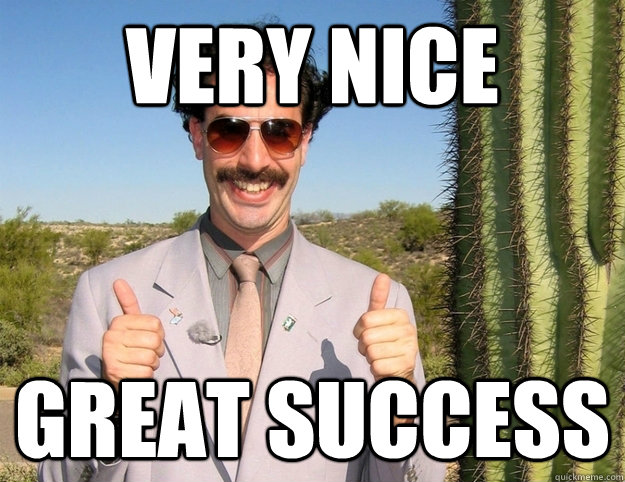

## Question 3

### (a) Crime, More or Less?

Let's visualize the amount of crime throughout the years and their severity, and check whether crime today is more severe than before, in a few graphs.

First graph we'll look at, is the graph of amount of general crimes throughout the years.
Let's prepare our data

Text(0.5, 1.0, 'Crime number per year')

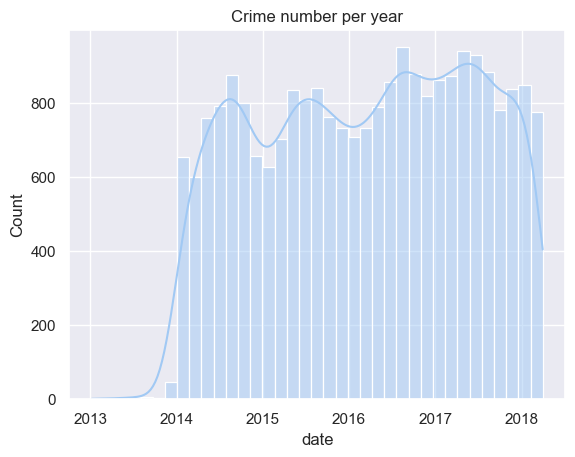

In [22]:
date_df = pd.to_datetime(df['date'])
date_df=date_df.to_frame().sort_values(by='date', ascending=True)
sns.histplot(data=date_df,x='date',kde=True).set_title("Crime number per year")

We can see that the actual general crime over the years have been increasing, and the probable decline in crimes in 2018 isn't because people became good, but rather because of low number of crime data that we have about the year 2018.

Which is

In [23]:
date_df['date'].dt.year.eq(2018).sum()

1414

Let's check the stats for the crimes that contain gun violence, we'll do that buy checking the total number of guns used in crimes thoughout the years.

/var/folders/qt/tyk9880j5h7g06zjrjlnjndm0000gn/T/ipykernel_868/3467134248.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m['date'] = pd.to_datetime(m['date'])


<AxesSubplot:xlabel='date'>

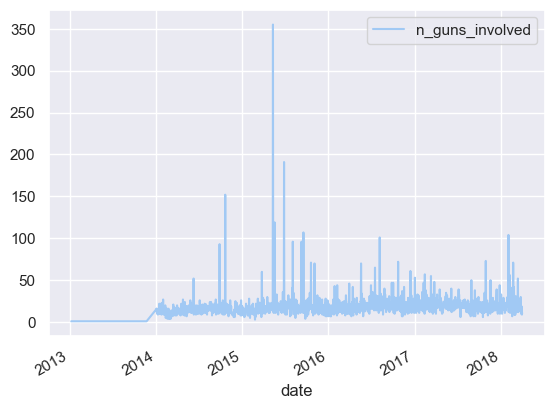

In [24]:
m = df[['date','n_guns_involved']]
m['date'] = pd.to_datetime(m['date'])
m_sum = m.sort_values(by='date', ascending=True).groupby(['date']).sum()
m_sum.plot()

We can see that there was a huge peak in gun violence in the year 2015-2016, but toher than that there wasn't an obvious increase.

### (b) Crime by location

Let's import the neccessary library to visualize the location data

In [25]:
import plotly.express as px
import folium

I will plot the stats depending on the latitude and longitude data, before I explain why, let's have a look at the value counts of the latitude first

In [26]:
df['latitude'].value_counts()

its pretty far there, man    5629
33.6356                        20
39.294                         20
29.9872                        15
29.469                         12
                             ... 
47.2994                         1
39.3377                         1
38.4053                         1
34.0277                         1
27.7556                         1
Name: latitude, Length: 16038, dtype: int64

In the latitude, there exists 5.6k values that are "its pretty far there, man" (apparantly policemen like to be ironic), and even though we were able in the previous part to greately correct the states and cities data, I still chose to plot by latitude and longitude, since as i checked, plotting by the State requires quite alot of pre-proccessing - which is adding the state code for each and every state in a new column, so the plotting library can work with that, i also refrained from using the street address, since every mis-spell of a street name, can lead to the data being inaccurate, rather than rely on human error, I hardly believe that the latitude and longitude data was put in by a human, as each number is large and this kind of info is always sampled by a machine.

The negatives of my choice is that i sorta lost a chunk of information, but we'll plot the rest and see if it's successfull.

We'll clean the latitude value, and plot the data

In [27]:
location_df = df.loc[df['latitude'] != "its pretty far there, man"]

In [28]:
location_df['latitude'].value_counts()

33.6356    20
39.294     20
29.9872    15
29.7654    12
29.469     12
           ..
47.2994     1
39.3377     1
38.4053     1
34.0277     1
27.7556     1
Name: latitude, Length: 16037, dtype: int64

In [29]:
m = folium.Map(location=[48, -102], zoom_start=3)
us_coords = [48, -102]
m_2 = folium.Map(location=us_coords, tiles='openstreetmap')


for i, coords in enumerate(list(zip(location_df['latitude'], location_df['longitude']))):

    folium.CircleMarker(coords, radius=int(2*df.iloc[i]["n_killed"]) , fill=True, color='red', fill_color='red').add_to(m_2)

m_2

Each circle represents a crime that has been reported, and the wider the circle, the more people have been killed in crime, as we can see the areas on the coast contain more crime reports and more people killed than inner states, ,although people in coastal states have sea, and the inner state do not, so logically they should be angrier.

Also it appears that the East of US, people are more into purging eachother, and the crime rate there is much larger

Still, it's pretty fun to visualize the data and see the results.